# Variability of PBMCs in cancer samples


---

---

## 0. Environmental setup

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import random
import os
import matplotlib.pyplot as plt
import tifffile
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import roc_curve, roc_auc_score, RocCurveDisplay
from tqdm import tqdm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statannot import add_stat_annotation
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from skimage.io import imread
from statsmodels.stats.multitest import fdrcorrection
from scipy.stats import ranksums, ttest_ind
from statannotations.Annotator import Annotator
from collections import Counter
from hdbscan import HDBSCAN

import matplotlib as mpl

mpl.rcParams["figure.dpi"] = 300

import sys
import cv2 as cv

sys.path.append("../..")
from src.utils.notebooks.eda import *

seed = 1234
random.seed(1234)
np.random.seed(1234)

%reload_ext nb_black

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [4]:
def get_stratified_data(data, id_column="id", cond_column="cancer", seed=1234):
    np.random.seed(seed)
    sampler = RandomUnderSampler(random_state=seed)

    # Subsample such that each patient is represented by the same number of nuclei
    id_labels = np.array(data.loc[:, id_column])
    res_data, res_id_labels = sampler.fit_resample(data, id_labels)

    # Subsample such that we have an equal number of nuclei per condition
    cond_labels = np.array(res_data.loc[:, cond_column])
    res_data, res_cond_labels = sampler.fit_resample(res_data, cond_labels)
    return res_data

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [5]:
def get_chrometric_data(data, proteins, exclude_dna_int=True):
    data = data._get_numeric_data()
    for protein in proteins:
        data = data[data.columns.drop(list(data.filter(regex=protein)))]
    if exclude_dna_int:
        data = data[data.columns.drop(list(data.filter(regex="dna")))]
        data = data[data.columns.drop(list(data.filter(regex="int")))]
        data = data.drop(columns=["i80_i20"])
    return data

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [6]:
def get_random_images(
    data,
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
    file_name_col="file_name",
):
    images = []
    np.random.seed(seed)
    sample_idc = np.random.choice(list(range(len(data))), replace=False, size=n_images)
    nuclei_file_names = np.array(data.loc[:, file_name_col])[sample_idc]
    nuclei_dirs = np.array(data.loc[:, data_dir_col])[sample_idc]
    for i in range(len(nuclei_file_names)):
        nuclei_dir = nuclei_dirs[i]
        nuclei_file_name = nuclei_file_names[i]
        image = imread(
            os.path.join(nuclei_dir, image_file_path, nuclei_file_name) + file_ending
        )
        images.append(image)
    return images

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [7]:
def padding(array, height, width):
    """
    :param array: numpy array
    :param xx: desired height
    :param yy: desirex width
    :return: padded array
    """

    h = array.shape[0]
    w = array.shape[1]

    center_y = (height - h) // 2
    pad_y = height - center_y - h

    center_x = (width - w) // 2
    pad_x = width - center_x - w

    return np.pad(
        array, pad_width=((center_y, pad_y), (center_x, pad_x)), mode="constant"
    )

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [8]:
def plot_montage(
    images,
    cmap="viridis",
    nrows=6,
    ncols=6,
    figsize=[12, 12],
    pad_size=144,
    mask_nuclei=False,
):
    fig, ax = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols)
    ax = ax.flatten()
    for i in range(len(ax)):
        image = images[i].max(axis=0)[0, :, :]
        mask = images[i].max(axis=0)[-1, :, :]
        if mask_nuclei:
            image = image * mask
        image = padding(image, pad_size, pad_size)
        image = np.clip(image / 256.0, 0, 255).astype(np.uint8)
        ax[i].imshow(image, cmap=cmap, vmin=0, vmax=255)
        ax[i].axis("off")
        ax[i].set_aspect("equal")
    plt.subplots_adjust(wspace=0, hspace=0.05)
    return fig, ax

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [9]:
def get_tsne_embs(data, scale_data=True, seed=1234):
    if scale_data:
        sc = StandardScaler()
        data = pd.DataFrame(
            sc.fit_transform(data), index=data.index, columns=data.columns
        )

    mapper = TSNE(
        random_state=seed,
        n_components=2,
        perplexity=np.ceil(np.sqrt(len(data))),
        init="pca",
        learning_rate="auto",
    )
    embs = pd.DataFrame(
        mapper.fit_transform(data), columns=["tSNE 1", "tSNE 2"], index=data.index
    )
    return embs

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [10]:
def plot_cv_conf_mtx(
    estimator,
    features,
    labels,
    scale_features=True,
    n_folds=10,
    cmap="viridis",
    figsize=[6, 4],
    seed=1234,
    vmin=0,
    vmax=1,
    fmt=".4f",
    order=None,
):
    if scale_features:
        sc = StandardScaler()
        features = pd.DataFrame(
            sc.fit_transform(features), index=features.index, columns=features.columns
        )

    avg_conf_mtx = compute_avg_conf_mtx(
        model=estimator, n_folds=n_folds, features=features, labels=labels
    )
    if order is not None:
        avg_conf_mtx = avg_conf_mtx.loc[order, order]

    fig, ax = plt.subplots(figsize=figsize)
    ax = sns.heatmap(
        avg_conf_mtx,
        annot=True,
        cmap=cmap,
        ax=ax,
        vmin=vmin,
        vmax=vmax,
        fmt=fmt,
    )
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    return fig, ax

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [11]:
def plot_feature_importance_for_estimator(
    estimator, features, labels, scale_features=True, cmap="gray", figsize=[6, 4]
):
    if scale_features:
        sc = StandardScaler()
        features = pd.DataFrame(
            sc.fit_transform(features), index=features.index, columns=features.columns
        )
    estimator = estimator.fit(features, labels)
    fig, ax = plot_feature_importance(
        estimator.feature_importances_,
        features.columns,
        "RFC",
        figsize=figsize,
        cmap=cmap,
    )
    ax.set_title("")
    return fig, ax

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [12]:
def find_markers(data, labels):
    results = []
    i = 0
    for label in tqdm(np.unique(labels), desc="Run marker screen"):
        label_results = {
            "label": [],
            "marker": [],
            "fc": [],
            "abs_delta_fc": [],
            "pval": [],
        }
        for c in data.columns:
            i += 1
            x = np.array(data.loc[labels == label, c])
            y = np.array(data.loc[labels != label, c])
            x = np.array(x[x != np.nan]).astype(float)
            y = np.array(y[y != np.nan]).astype(float)

            pval = ttest_ind(x, y, equal_var=False)[1]
            fc = (np.mean(x) + 1e-15) / (np.mean(y) + 1e-15)
            label_results["label"].append(label)
            label_results["marker"].append(c)
            label_results["fc"].append(fc)
            label_results["abs_delta_fc"].append(abs(fc - 1))
            label_results["pval"].append(pval)
        label_result = pd.DataFrame(label_results)
        label_result.pval = label_result.pval.astype(float)
        label_result = label_result.sort_values("pval")
        results.append(label_result)
    result = pd.concat(results)
    result["pval_adjust"] = fdrcorrection(np.array(result.loc[:, "pval"]))[1]
    return result.sort_values("pval_adjust")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
def plot_marker_distribution(
    data,
    marker,
    label_col,
    box_pairs,
    figsize=[6, 4],
    stat_annot="full",
    hue=None,
    order=None,
    hue_order=None,
    palette=None,
    quantiles=None,
    cut=2,
    plot_type="violin",
):
    fig, ax = plt.subplots(figsize=figsize)
    if quantiles is not None:
        data = data.loc[
            (data.loc[:, marker] < np.quantile(data.loc[:, marker], q=quantiles[1]))
            & (data.loc[:, marker] > np.quantile(data.loc[:, marker], q=quantiles[0]))
        ]
    if plot_type == "violin":
        ax = sns.violinplot(
            data=data,
            x=label_col,
            y=marker,
            hue=hue,
            ax=ax,
            order=order,
            hue_order=hue_order,
            palette=palette,
            width=0.8,
            cut=cut,
        )
    elif plot_type == "bar":
        ax = sns.barplot(
            data=data,
            x=label_col,
            y=marker,
            ax=ax,
            hue=hue,
            hue_order=hue_order,
            order=order,
        )
    else:
        raise NotImplementedError

    annotator = Annotator(
        ax,
        box_pairs,
        data=data,
        x=label_col,
        y=marker,
        hue=hue,
        order=order,
        hue_order=hue_order,
        plot=plot_type + "plot",
    )
    annotator.configure(test="t-test_ind", text_format="star", loc="inside")
    annotator.apply_test()
    annotator.annotate()

    return fig, ax

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [113]:
def plot_rep_prot_markers_dist(
    data, markers, marker_labels, quantiles=None, cut=2, plot_type="violin"
):
    for i in range(len(markers)):
        fig, ax = plot_marker_distribution(
            data,
            figsize=[6, 4],
            marker=markers[i],
            label_col="replicate",
            box_pairs=[
                ("1", "1_2"),
                ("1", "2"),
                ("1", "3"),
                ("1_2", "2"),
                ("1_2", "3"),
                ("2", "3"),
            ],
            stat_annot="star",
            quantiles=quantiles,
            cut=cut,
            plot_type=plot_type,
        )
        ax.set_xlabel("condition")
        ax.set_ylabel(marker_labels[i])
        plt.show()
        plt.close()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [131]:
def plot_rep_protein_markers_dist(
    data, markers, marker_labels, quantiles=None, cut=2, plot_type="violin"
):
    for i in range(len(markers)):
        fig, ax = plot_marker_distribution(
            data,
            figsize=[6, 4],
            marker=markers[i],
            label_col="replicate",
            box_pairs=[("1", "3"), ("1", "1_2"), ("1_2", "3")],
            stat_annot="star",
            quantiles=quantiles,
            cut=cut,
            plot_type=plot_type,
        )
        ax.set_xlabel("condition")
        ax.set_ylabel(marker_labels[i])
        plt.show()
        plt.close()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 1. Read in data

#### Replicate 1

In [80]:
rep1_root_data_dir = "../../data/glioma/variability/rep1"
feature_file_path = "/preprocessed/full_pipeline/nuclear_features.csv"
qc_result_file_path = "/preprocessed/full_pipeline/segmentation/qc_results.csv"

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [81]:
rep1_data = read_in_protein_dataset(
    data_dir=rep1_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
)
rep1_data["id"] = rep1_data["sample"] + rep1_data["timepoint"]
rep1_data["replicate"] = "1"
rep1_data["file_name"] = np.array(list(rep1_data.index))

Load data: 100%|██████████| 2/2 [00:00<00:00, 24.30it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Replicate 1_2

In [82]:
rep1_2_root_data_dir = "../../data/glioma/variability/rep1_2"

rep1_2_data = read_in_protein_dataset(
    data_dir=rep1_2_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
)
rep1_2_data["id"] = rep1_2_data["sample"] + rep1_2_data["timepoint"]
rep1_2_data["replicate"] = "1_2"
rep1_2_data["file_name"] = np.array(list(rep1_2_data.index))

Load data: 100%|██████████| 2/2 [00:00<00:00, 24.39it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Replicate 2

In [83]:
rep2_root_data_dir = "../../data/glioma/variability/rep2"

rep2_data = read_in_protein_dataset(
    data_dir=rep2_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
)
rep2_data["id"] = rep2_data["sample"] + rep2_data["timepoint"]
rep2_data["replicate"] = "2"
rep2_data["file_name"] = np.array(list(rep2_data.index))

Load data: 100%|██████████| 2/2 [00:00<00:00, 24.77it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Replicate 3

In [84]:
rep3_root_data_dir = "../../data/glioma/variability/rep3"

rep3_data = read_in_protein_dataset(
    data_dir=rep3_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
)
rep3_data["id"] = rep3_data["sample"] + rep3_data["timepoint"]
rep3_data["replicate"] = "3"
rep3_data["file_name"] = np.array(list(rep3_data.index))

Load data: 100%|██████████| 2/2 [00:00<00:00, 28.69it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 2. Data preprocessing

Before we analyze the data, we will first preprocess it.

To this end, we first remove features with missing values and samples with missing features.

In [85]:
rep1_data = preprocess_data(rep1_data, remove_constant_features=False)
rep1_2_data = preprocess_data(rep1_2_data, remove_constant_features=False)
rep2_data = preprocess_data(rep2_data, remove_constant_features=False)
rep3_data = preprocess_data(rep3_data, remove_constant_features=False)

Nuclei that did not pass the quality check: 17/697. Remaining: 680.
Removed 12 constant or features with missing values. Remaining: 291.
Removed additional 6 features. Remaining: 285.
Nuclei that did not pass the quality check: 69/1179. Remaining: 1110.
Removed 9 constant or features with missing values. Remaining: 294.
Removed additional 6 features. Remaining: 288.
Nuclei that did not pass the quality check: 73/1147. Remaining: 1074.
Removed 6 constant or features with missing values. Remaining: 296.
Removed additional 6 features. Remaining: 290.
Nuclei that did not pass the quality check: 42/854. Remaining: 812.
Removed 9 constant or features with missing values. Remaining: 294.
Removed additional 6 features. Remaining: 288.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

___

#### Subsampling

We first subsample the data set such that for each condition (control vs. cancer) we have the same number of nuclei in the data set. Additionally, we ensure that for the cancer population we have approximately equal number of nuclei from each biological sample.

In [86]:
sampled_rep1_data = get_stratified_data(
    rep1_data, id_column="id", cond_column="sample", seed=1234
)
sampled_rep1_2_data = get_stratified_data(
    rep1_2_data, id_column="id", cond_column="sample", seed=1234
)
sampled_rep2_data = get_stratified_data(
    rep2_data, id_column="id", cond_column="sample", seed=1234
)

sampled_rep3_data = get_stratified_data(
    rep3_data, id_column="id", cond_column="sample", seed=1234
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

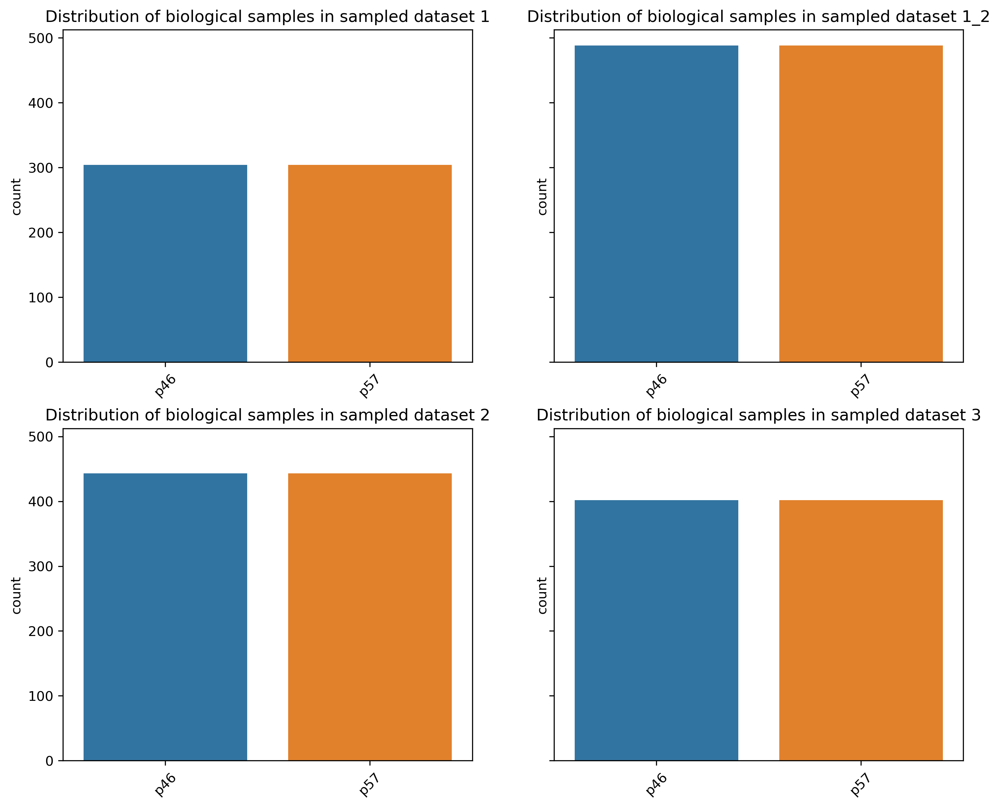

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [137]:
rep_labels = ["1", "1_2", "2", "3"]

fig, ax = plt.subplots(figsize=[12, 10], ncols=2, nrows=2, sharey=True)
ax = ax.flatten()
ax[0] = sns.countplot(
    x="sample",
    data=sampled_rep1_data,
    ax=ax[0],
    order=np.unique(sampled_rep1_data.loc[:, "sample"]),
)
ax[1] = sns.countplot(
    x="sample",
    data=sampled_rep1_2_data,
    ax=ax[1],
    order=np.unique(sampled_rep1_data.loc[:, "sample"]),
)
ax[2] = sns.countplot(
    x="sample",
    data=sampled_rep2_data,
    ax=ax[2],
    order=np.unique(sampled_rep2_data.loc[:, "sample"]),
)
ax[3] = sns.countplot(
    x="sample",
    data=sampled_rep3_data,
    ax=ax[3],
    order=np.unique(sampled_rep2_data.loc[:, "sample"]),
)
for i in range(len(ax)):
    ax[i].set_xlabel("")
    ax[i].set_title(
        "Distribution of biological samples in sampled dataset {}".format(rep_labels[i])
    )
    for tick in ax[i].get_xticklabels():
        tick.set_rotation(45)
plt.show()
plt.close()

----

#### Sample and feature selection

We now filter out constant features and nuclei with missing features. We will do that for both replicates individually. However, we will also combine the two replicates to provide a joint analysis.

In [89]:
data = preprocess_data(
    sampled_rep1_data.append(sampled_rep1_2_data)
    .append(sampled_rep2_data)
    .append(sampled_rep3_data),
    remove_constant_features=True,
)

Nuclei that did not pass the quality check: 0/3274. Remaining: 3274.
Removed 130 constant or features with missing values. Remaining: 221.
Removed additional 0 features. Remaining: 221.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

#### Data preparation

After sampling the data, we will now prepare the data for the consecutive analysis, i.e. extracting only chrometric features and corresponding metadata information.

In [90]:
chrometric_data = get_chrometric_data(data, proteins=[], exclude_dna_int=True)
sample_labels = data.loc[:, "sample"]
rep_labels = data.replicate

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Finally, we remove highly correlated features (Pearson $\rho > 0.8$) from the chrometric features.

In [91]:
chrometric_data = remove_correlated_features(chrometric_data, threshold=0.8)

Removed 138/193 features with a Pearson correlation above 0.8. Remaining: 55


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 3. Panels

Now we generate the individual panels for figure 2 of the paper.


### 3a. Visualization of the global nuclear phenotypes of control vs cancer population

First, we provide a visual representation of the different nuclear phenotypes in health and cancer. To this end, we will randomly sample 36 nuclei from each condition and plot a corresponding montage of the max-z projected DNA images. To visualize size differences each nuclei is padded to a size of 96x96 pixels.

In [93]:
image_file_path = "preprocessed/full_pipeline/segmentation/nuclei_images"
sampled_rep1_images = get_random_images(
    sampled_rep1_data,
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
    file_name_col="file_name",
)
sampled_rep1_2_images = get_random_images(
    sampled_rep1_2_data,
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
    file_name_col="file_name",
)
sampled_rep2_images = get_random_images(
    sampled_rep2_data,
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
    file_name_col="file_name",
)
sampled_rep3_images = get_random_images(
    sampled_rep3_data,
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
    file_name_col="file_name",
)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Replicate 1

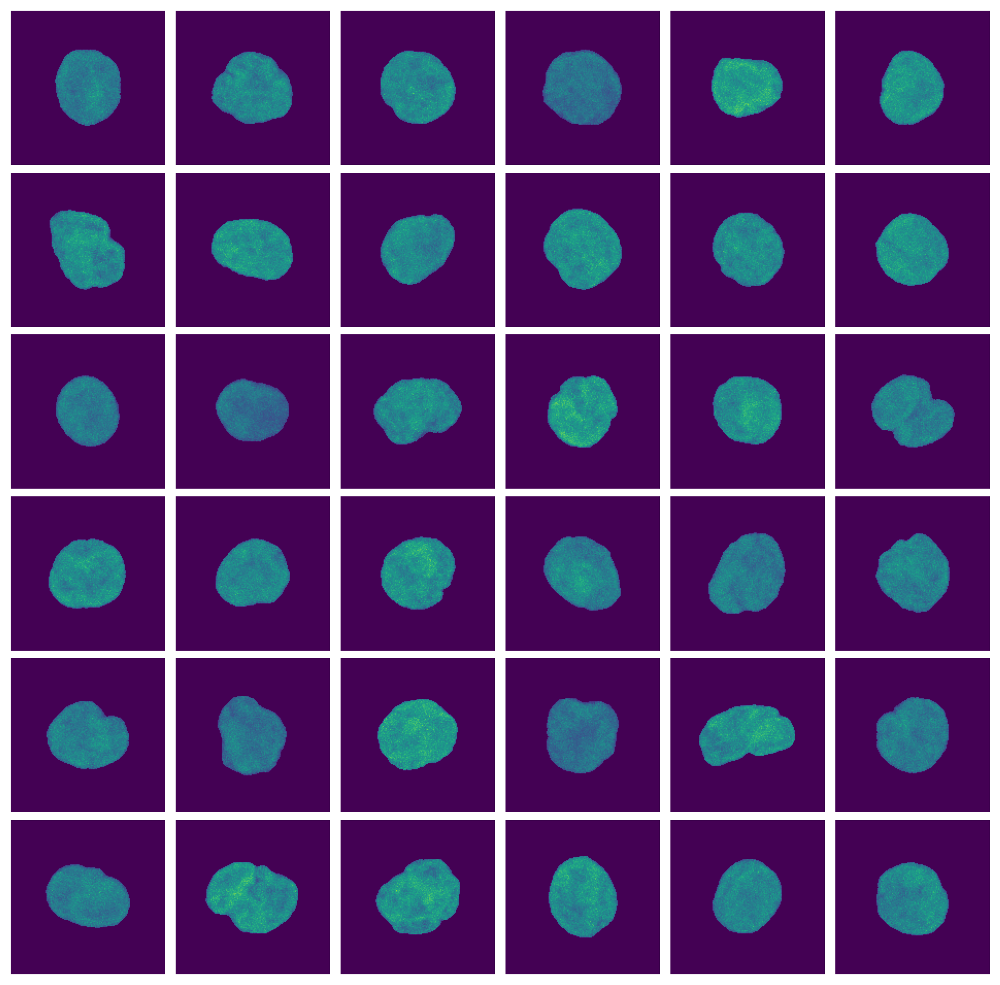

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [68]:
fig_rep1, ax_rep1 = plot_montage(sampled_rep1_images, pad_size=150, mask_nuclei=True)

### Replicate 1-2

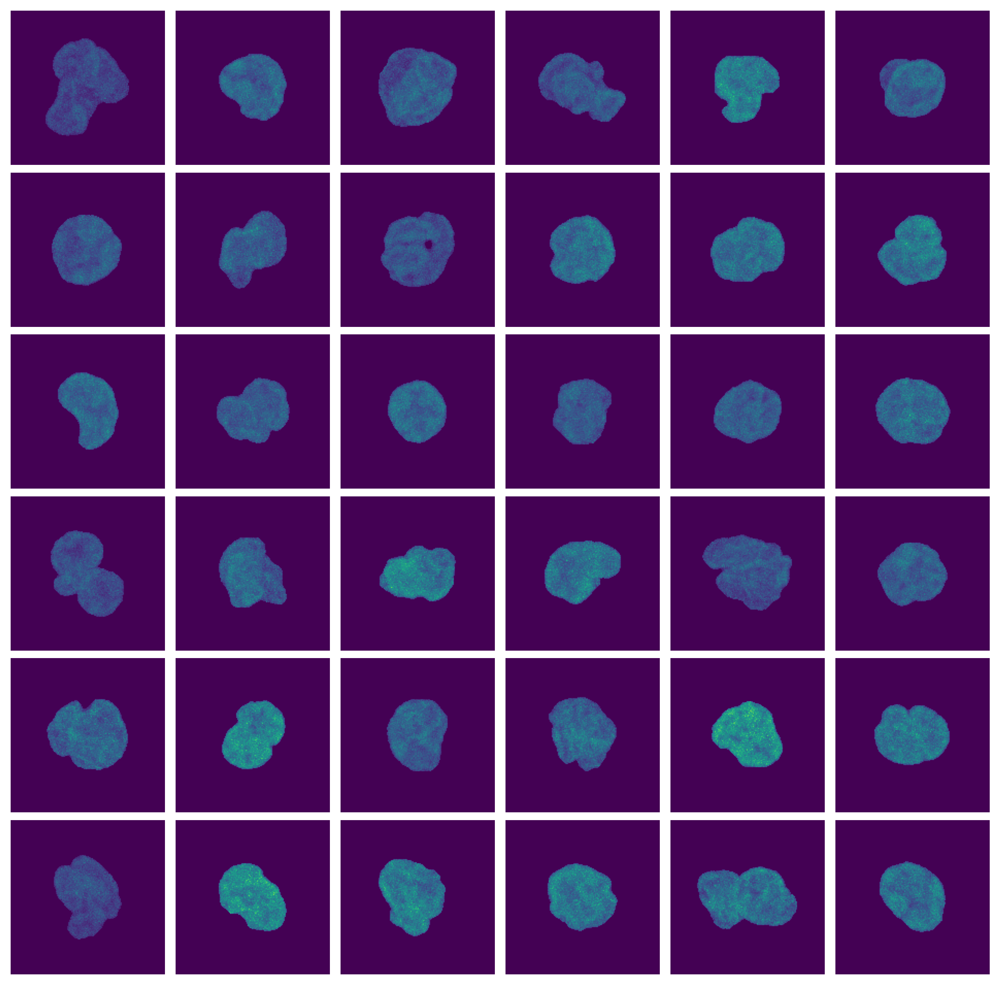

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [94]:
fig_rep1_2, ax_rep1_2 = plot_montage(
    sampled_rep1_2_images, pad_size=150, mask_nuclei=True
)

### Replicate 2

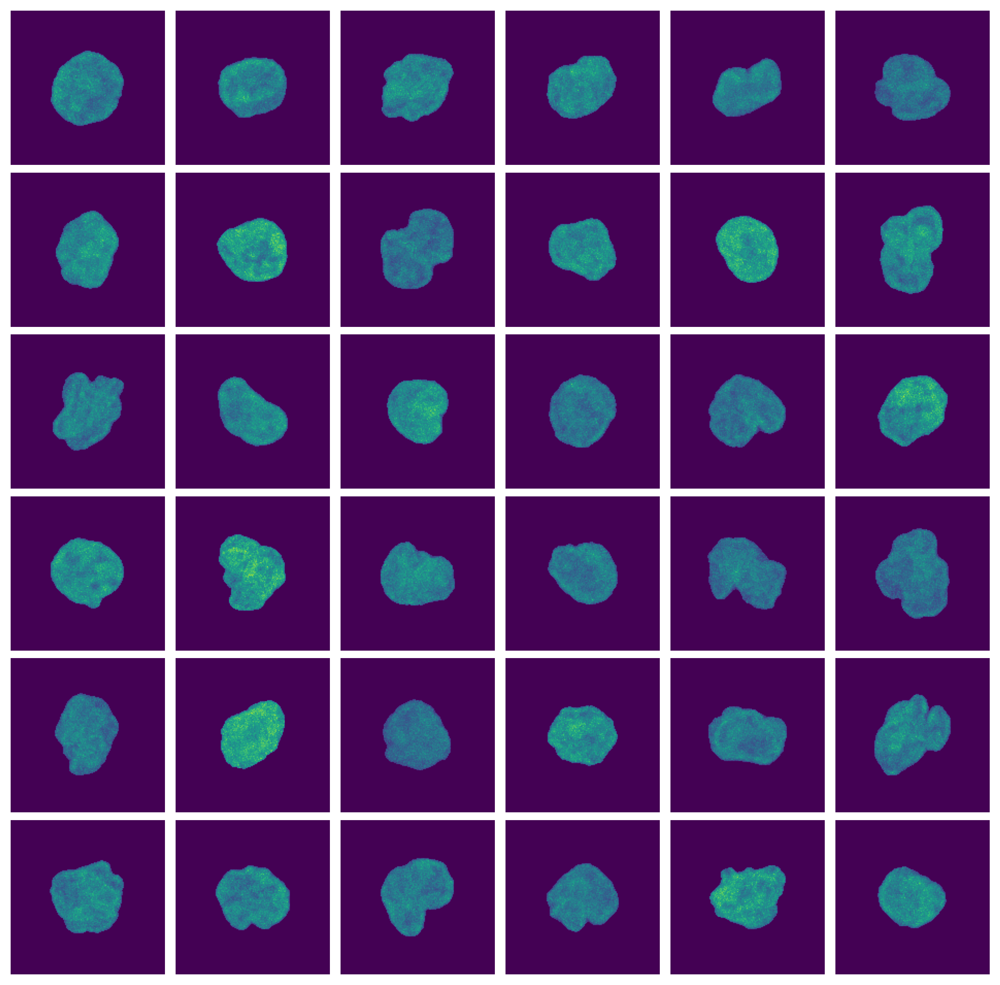

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [69]:
fig_rep2, ax_rep2 = plot_montage(sampled_rep2_images, pad_size=150, mask_nuclei=True)

### Replicate 3

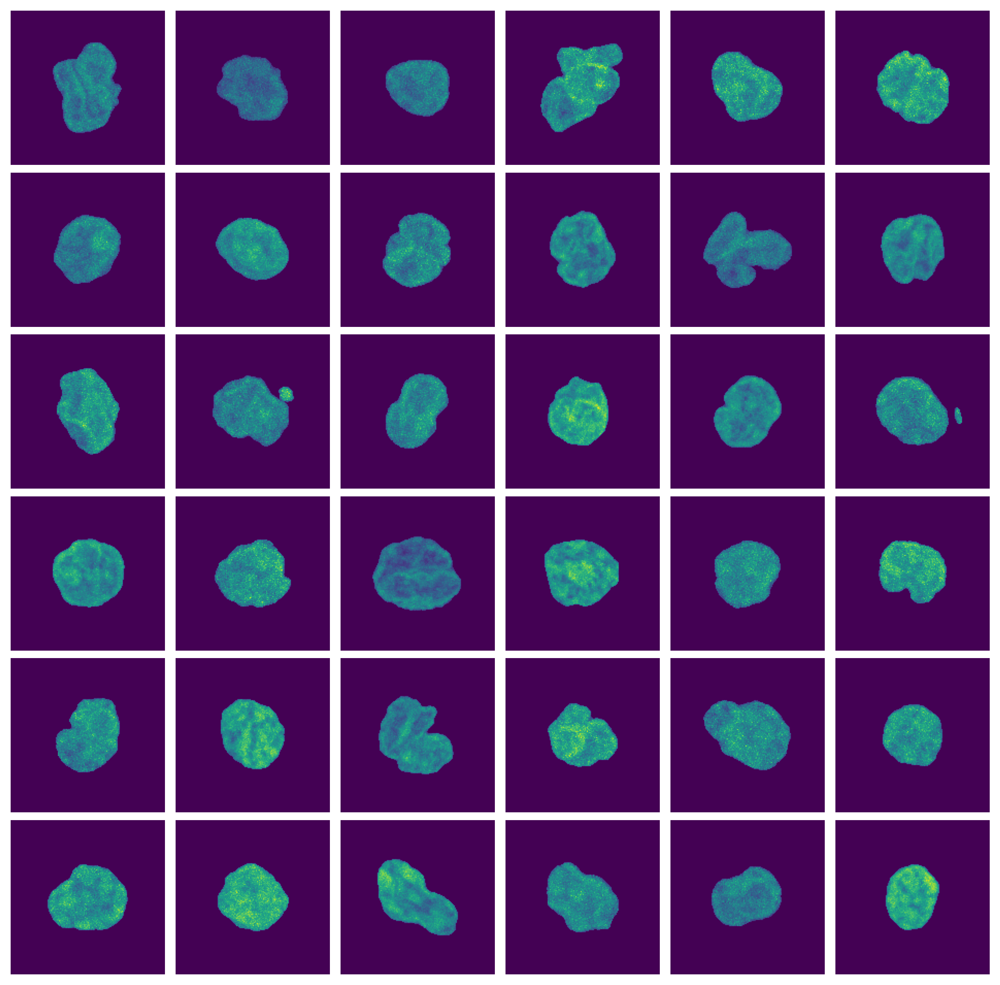

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [70]:
fig_rep3, ax_rep3 = plot_montage(sampled_rep3_images, pad_size=150, mask_nuclei=True)

---

### 3b. Parametric analysis

In [95]:
chrometric_embs = get_tsne_embs(chrometric_data)
chrometric_embs["sample"] = sample_labels
chrometric_embs["replicate"] = rep_labels

/home/paysan_d/miniconda3/envs/icp/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

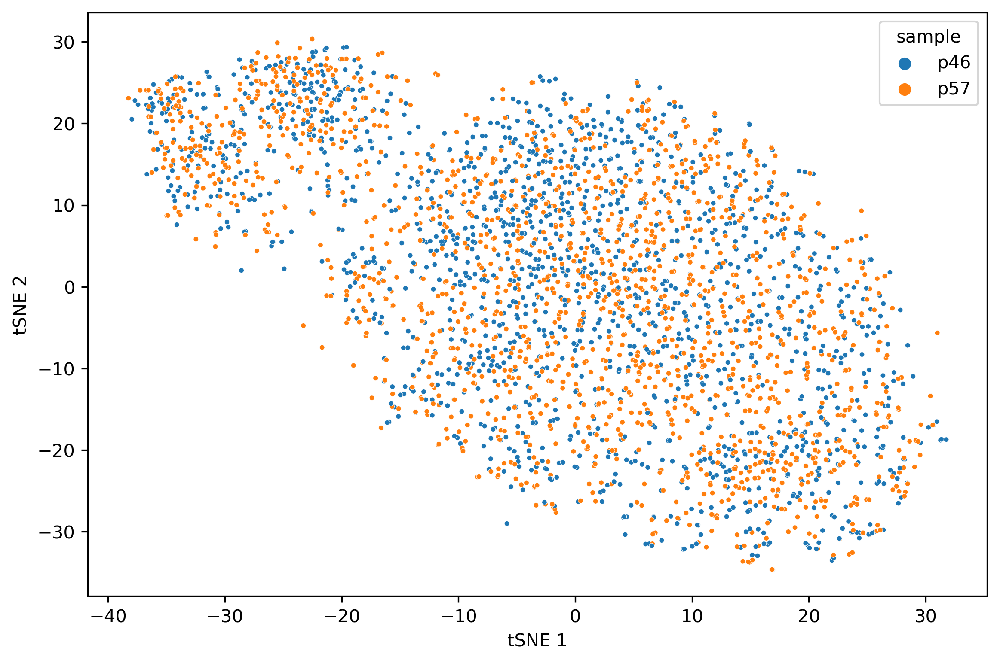

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [96]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs,
    x="tSNE 1",
    y="tSNE 2",
    hue="sample",
    ax=ax,
    s=8,
    marker="o",
)
plt.show()

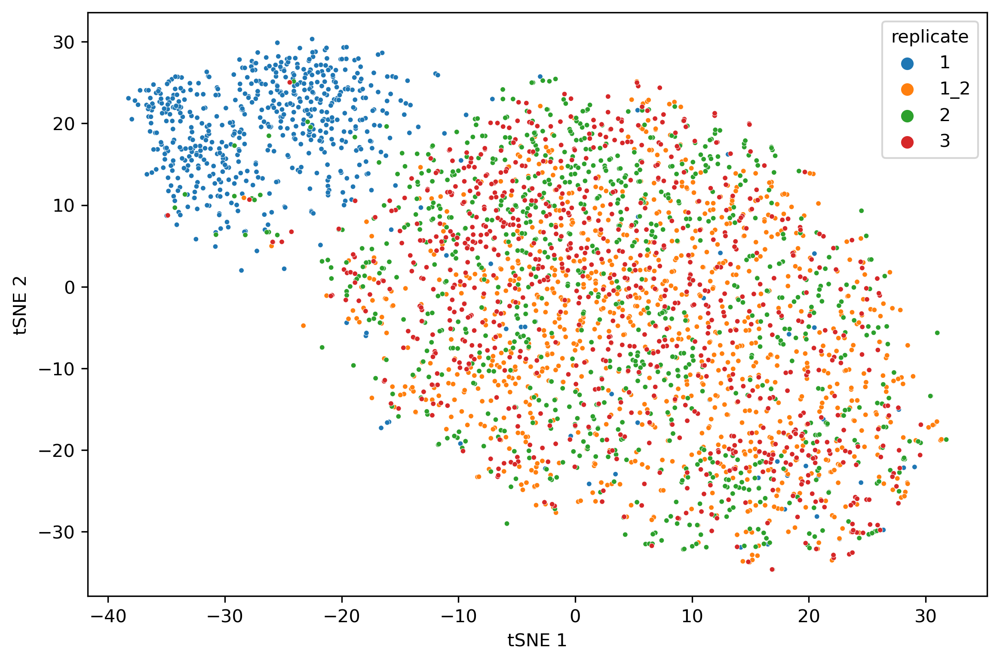

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [98]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs,
    x="tSNE 1",
    y="tSNE 2",
    hue="replicate",
    ax=ax,
    s=8,
    marker="o",
    palette="tab10",
)
plt.show()

To quantify the separability of the two conditions we perform a 10-fold stratified cross-validation analysis using a RandomForest classifier. The classifier provides a simple non-linear classification model which also yields an importance measure for the individual chrometric features indicating which ones are most different between the two populations.

In [99]:
rfc = RandomForestClassifier(
    n_estimators=500, n_jobs=10, random_state=seed, class_weight="balanced"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

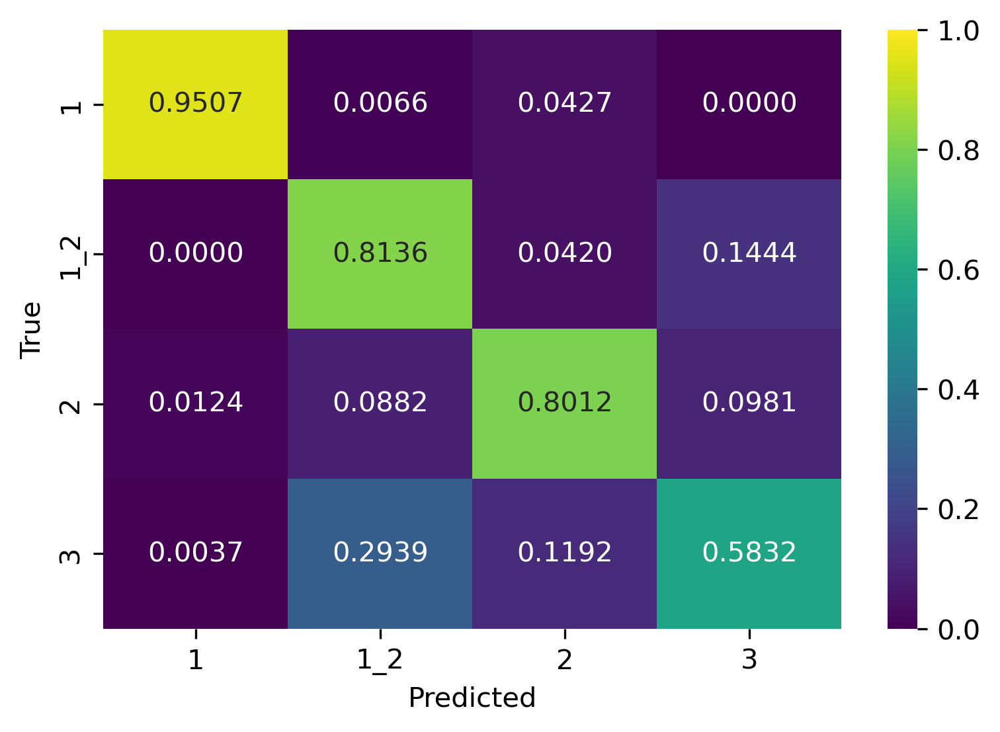

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [101]:
fig, ax = plot_cv_conf_mtx(
    estimator=rfc,
    features=chrometric_data,
    labels=rep_labels,
    scale_features=True,
    n_folds=10,
    cmap="viridis",
    figsize=[6, 4],
    seed=1234,
)


The classifier is able to accurately distinguish nuclei from the different cancer populations and it does particularly well on samples from the head&neck cancer population.

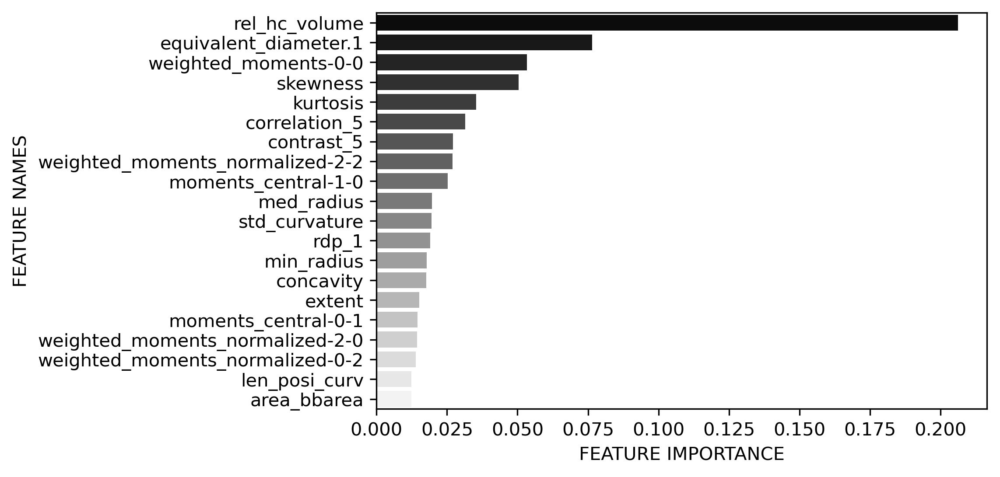

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [102]:
fig, ax = plot_feature_importance_for_estimator(
    rfc,
    chrometric_data,
    rep_labels,
    scale_features=True,
    cmap="gray",
    figsize=[6, 4],
)

We observe that the most signficant differences between the batches are in great agreement with the features that we observed to be different between the different cancer types. The plot below shows the relative heterochromatin volume for each cancer type and replicate.

---

### 3c. Nuclear chromatin biomarkers identifying cancer populations

While the previously shown feature importance plots already suggest a number of candidate chrometric biomarkers that capture the differences of the nuclear phenotypes in health and cancer, we run marker screen by testing for differential distributions of the individual chrometric features between the control and cancer population. To this end, we apply a t-test to test for difference in the means and adjust for multiple testing using the Benjamini-Hochberg procedure.

#### Data set 1

In [103]:
marker_screen_results = find_markers(chrometric_data, rep_labels)

Run marker screen: 100%|██████████| 4/4 [00:00<00:00, 15.15it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [105]:
marker_screen_results.loc[marker_screen_results.label == "1"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
53,1,rel_hc_volume,0.795123,0.204877,0.000000e+00,0.000000e+00
50,1,equivalent_diameter.1,0.922682,0.077318,4.870943e-230,3.572025e-228
17,1,skewness,25.905754,24.905754,6.369145e-196,2.001731e-194
24,1,weighted_moments-0-0,1.340433,0.340433,1.846486e-177,5.077837e-176
22,1,correlation_5,1.086591,0.086591,2.196467e-152,5.369142e-151
8,1,std_curvature,0.765575,0.234425,9.045902e-118,1.990098e-116
3,1,min_radius,1.178673,0.178673,2.406140e-115,4.812279e-114
16,1,kurtosis,2.531617,1.531617,1.809040e-107,3.316573e-106
5,1,concavity,0.629578,0.370422,5.036866e-106,8.523928e-105
4,1,med_radius,1.064296,0.064296,1.199052e-100,1.884225e-99


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [106]:
marker_screen_results.loc[marker_screen_results.label == "1_2"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
53,1_2,rel_hc_volume,1.095625,0.095625,1.046986e-281,1.151684e-279
24,1_2,weighted_moments-0-0,0.807647,0.192353,1.544415e-211,8.494280e-210
17,1_2,skewness,-0.582837,1.582837,1.681521e-206,7.398694e-205
31,1_2,weighted_moments_normalized-2-2,1.454714,0.454714,1.164370e-75,1.423119e-74
22,1_2,correlation_5,0.941189,0.058811,2.982411e-75,3.453318e-74
50,1_2,equivalent_diameter.1,1.029544,0.029544,7.916719e-64,7.572514e-63
25,1_2,weighted_moments_normalized-0-2,1.210125,0.210125,1.185300e-61,1.086525e-60
29,1_2,weighted_moments_normalized-2-0,1.203158,0.203158,1.220450e-60,1.073996e-59
19,1_2,contrast_5,0.852056,0.147944,4.350521e-60,3.681210e-59
16,1_2,kurtosis,0.685583,0.314417,4.371979e-42,2.914653e-41


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [107]:
marker_screen_results.loc[marker_screen_results.label == "2"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
9,2,npolarity_changes,0.925634,0.074366,4.499698e-29,2.356985e-28
0,2,min_calliper,0.971422,0.028578,2.103774e-18,8.732648e-18
22,2,correlation_5,1.028041,0.028041,6.540936e-18,2.664826e-17
4,2,med_radius,0.978863,0.021137,7.407844e-18,2.963138e-17
54,2,rdp_1,0.695514,0.304486,3.254138e-17,1.278411e-16
17,2,skewness,2.094669,1.094669,8.169425e-17,3.153111e-16
3,2,min_radius,0.949930,0.050070,1.712503e-15,6.385603e-15
31,2,weighted_moments_normalized-2-2,0.895417,0.104583,9.591552e-10,3.103149e-09
21,2,homogeneity_100,0.627523,0.372477,6.953383e-09,2.185349e-08
25,2,weighted_moments_normalized-0-2,0.947683,0.052317,5.193732e-08,1.586974e-07


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [108]:
marker_screen_results.loc[marker_screen_results.label == "3"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
53,3,rel_hc_volume,1.085860,0.085860,5.157642e-199,1.891135e-197
16,3,kurtosis,0.548601,0.451399,6.504896e-64,6.504896e-63
50,3,equivalent_diameter.1,1.025136,0.025136,6.179239e-40,3.998331e-39
19,3,contrast_5,1.130508,0.130508,2.977098e-30,1.637404e-29
54,3,rdp_1,0.600340,0.399660,2.655165e-29,1.424722e-28
17,3,skewness,0.116145,0.883855,1.179343e-24,5.765678e-24
22,3,correlation_5,0.968640,0.031360,4.421894e-21,1.985340e-20
0,3,min_calliper,0.984364,0.015636,1.662080e-05,4.459240e-05
4,3,med_radius,0.988977,0.011023,2.134096e-05,5.589300e-05
10,3,max_posi_curv,1.054895,0.054895,2.502388e-05,6.474996e-05


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:8.697e-222 t=-3.762e+01
1_2 vs. 2: t-test independent samples, P_val:1.528e-20 t=9.401e+00
2 vs. 3: t-test independent samples, P_val:5.879e-15 t=-7.879e+00
1 vs. 2: t-test independent samples, P_val:1.903e-178 t=-3.284e+01
1_2 vs. 3: t-test independent samples, P_val:4.744e-01 t=7.155e-01
1 vs. 3: t-test independent samples, P_val:3.219e-185 t=-3.396e+01


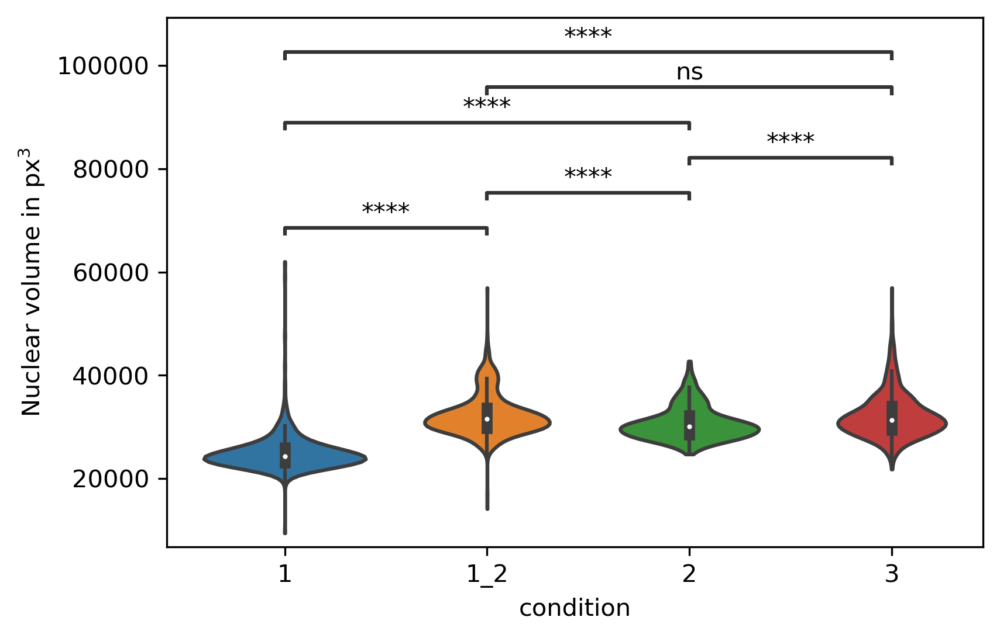

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:0.000e+00 t=-1.153e+02
1_2 vs. 2: t-test independent samples, P_val:0.000e+00 t=5.054e+01
2 vs. 3: t-test independent samples, P_val:1.712e-209 t=-3.582e+01
1 vs. 2: t-test independent samples, P_val:0.000e+00 t=-6.451e+01
1_2 vs. 3: t-test independent samples, P_val:3.077e-01 t=1.020e+00
1 vs. 3: t-test independent samples, P_val:0.000e+00 t=-8.644e+01


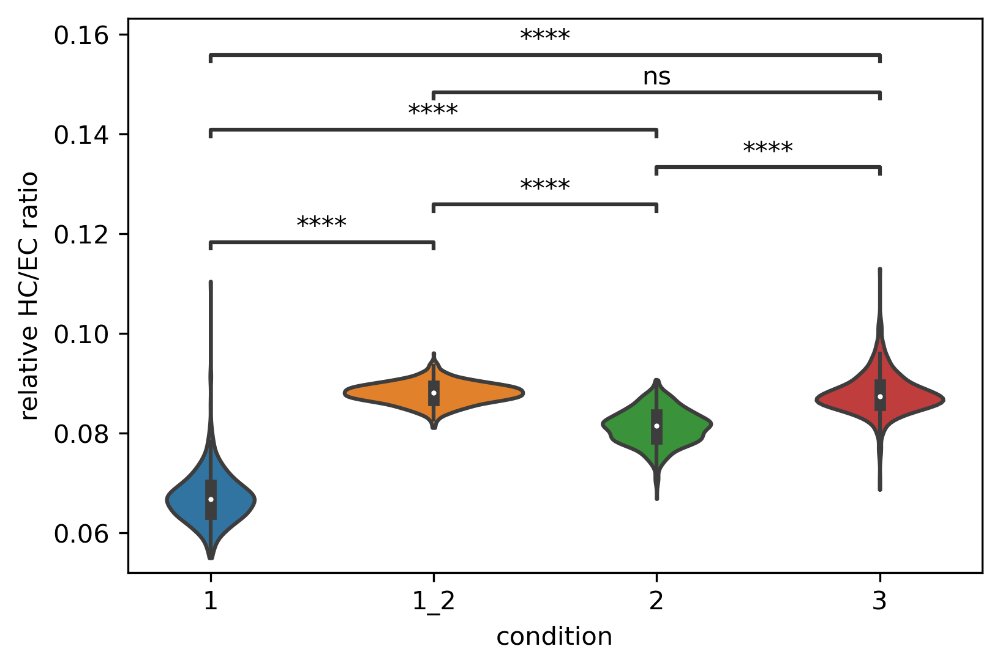

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:3.995e-69 t=-1.847e+01
1_2 vs. 2: t-test independent samples, P_val:3.406e-03 t=2.932e+00
2 vs. 3: t-test independent samples, P_val:9.561e-02 t=1.667e+00
1 vs. 2: t-test independent samples, P_val:1.003e-60 t=-1.722e+01
1_2 vs. 3: t-test independent samples, P_val:1.358e-05 t=4.363e+00
1 vs. 3: t-test independent samples, P_val:7.972e-45 t=-1.456e+01


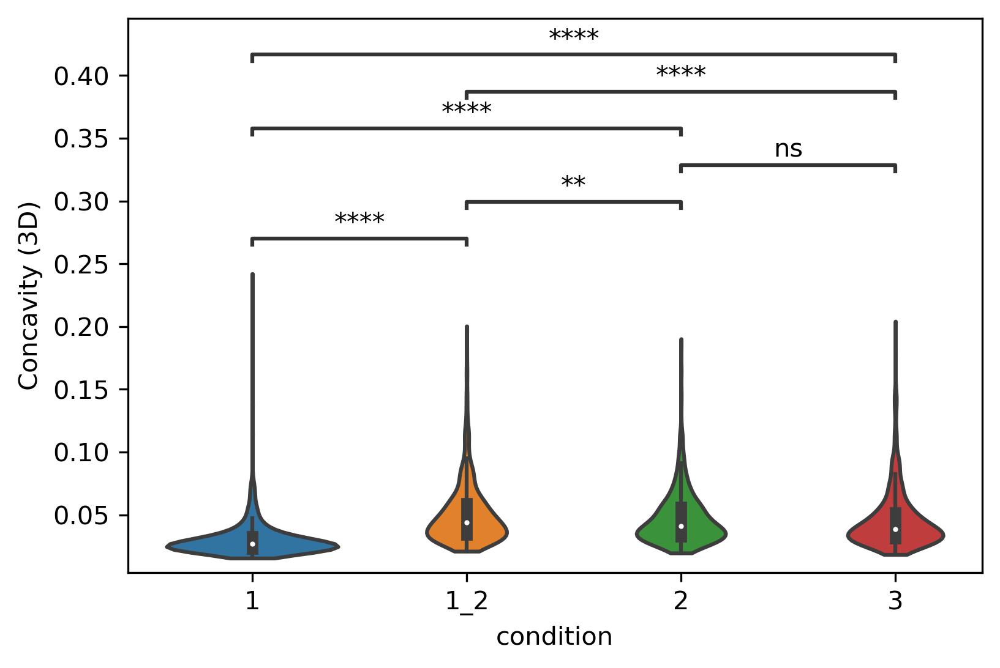

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:3.692e-104 t=-2.339e+01
1_2 vs. 2: t-test independent samples, P_val:8.048e-05 t=3.952e+00
2 vs. 3: t-test independent samples, P_val:8.804e-01 t=1.505e-01
1 vs. 2: t-test independent samples, P_val:1.461e-84 t=-2.080e+01
1_2 vs. 3: t-test independent samples, P_val:2.181e-04 t=3.705e+00
1 vs. 3: t-test independent samples, P_val:4.476e-66 t=-1.811e+01


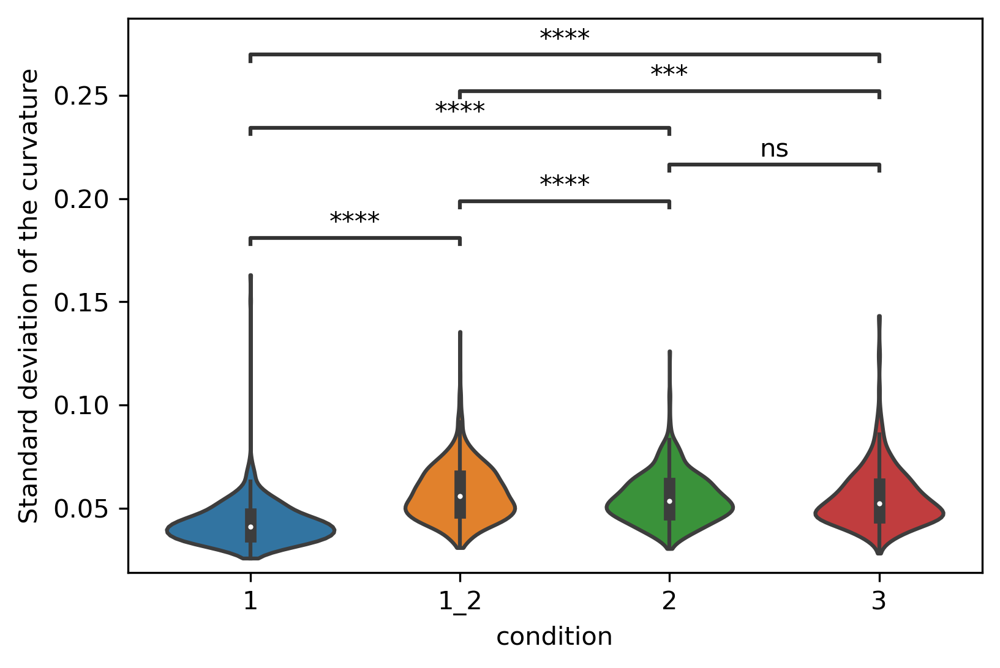

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:0.000e+00 t=-4.979e+01
1_2 vs. 2: t-test independent samples, P_val:2.872e-141 t=2.765e+01
2 vs. 3: t-test independent samples, P_val:1.248e-35 t=-1.275e+01
1 vs. 2: t-test independent samples, P_val:2.700e-108 t=-2.405e+01
1_2 vs. 3: t-test independent samples, P_val:9.887e-31 t=1.175e+01
1 vs. 3: t-test independent samples, P_val:4.051e-178 t=-3.308e+01


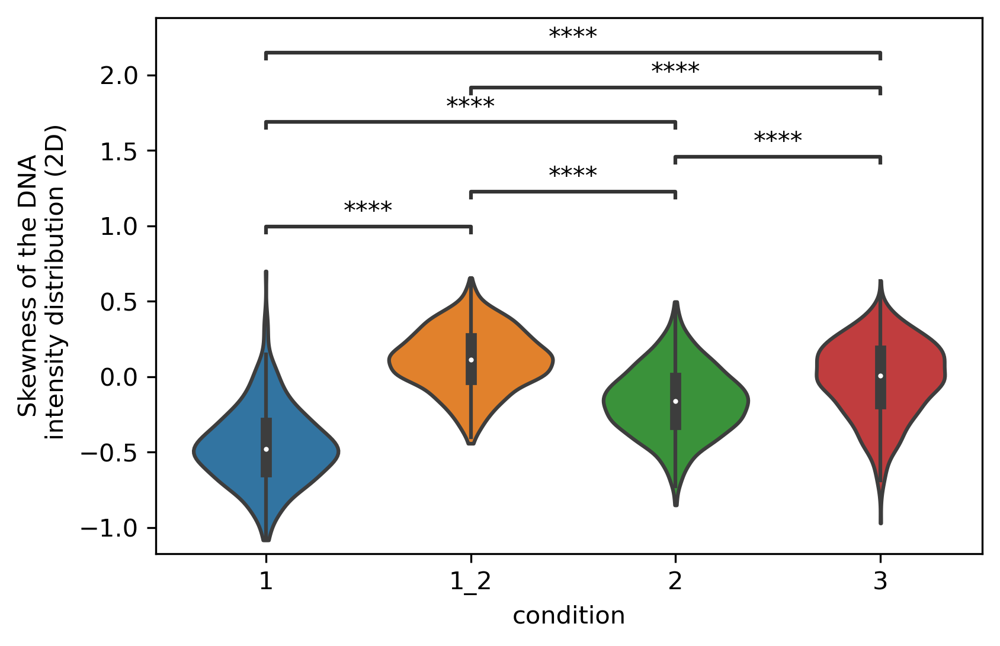

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:3.220e-30 t=1.166e+01
1_2 vs. 2: t-test independent samples, P_val:3.342e-27 t=-1.098e+01
2 vs. 3: t-test independent samples, P_val:2.887e-11 t=-6.697e+00
1 vs. 2: t-test independent samples, P_val:1.286e-01 t=1.520e+00
1_2 vs. 3: t-test independent samples, P_val:4.085e-60 t=-1.699e+01
1 vs. 3: t-test independent samples, P_val:2.322e-06 t=-4.743e+00


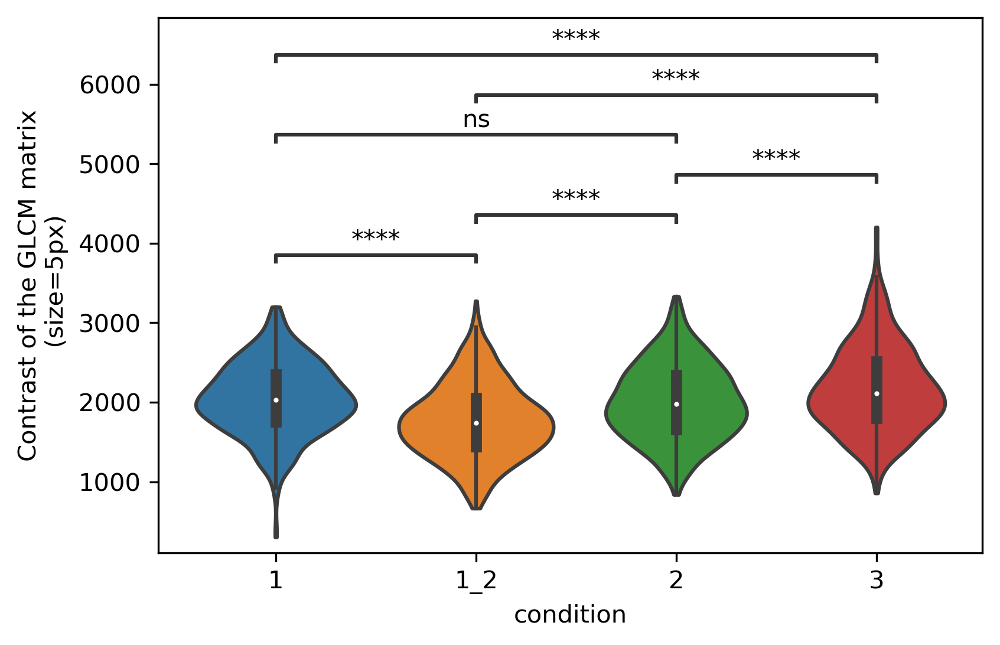

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [116]:
markers = [
    "nuclear_volume",
    "hc_ec_ratio_3d",
    "concavity",
    "std_curvature",
    "skewness",
    "contrast_5",
]
marker_labels = [
    r"Nuclear volume in px$^3$",
    "relative HC/EC ratio",
    "Concavity (3D)",
    "Standard deviation of the curvature",
    "Skewness of the DNA\n intensity distribution (2D)",
    "Contrast of the GLCM matrix\n (size=5px)",
]
plot_rep_markers_dist(data, markers, marker_labels, cut=0)

---

### 3d. Proteomic differences of PBMCs in cancer

Finally, we also assess the proteomic differences between the control and cancer populations. To this end, we plot the relative Lamin and gH2AX expression measured by the sum of the intensities of the corresponding imaging channels normalized by the nuclear volume. Additionally, we plot the number of identified gH2AX foci which are computed as the local maxima peaks found in the corresponding channel images.

Note that those features are only available for the first data set that was stained for those proteins.

In [121]:
list(rep1_data.append(rep3_data).columns)

['min_calliper',
 'max_calliper',
 'smallest_largest_calliper',
 'min_radius',
 'max_radius',
 'med_radius',
 'avg_radius',
 'mode_radius',
 'd25_radius',
 'd75_radius',
 'std_radius',
 'feret_max',
 'area',
 'perimeter',
 'bbox_area',
 'convex_area',
 'equivalent_diameter',
 'major_axis_length',
 'minor_axis_length',
 'eccentricity',
 'concavity',
 'solidity',
 'a_r',
 'shape_factor',
 'area_bbarea',
 'avg_curvature',
 'std_curvature',
 'npolarity_changes',
 'max_posi_curv',
 'avg_posi_curv',
 'med_posi_curv',
 'std_posi_curv',
 'sum_posi_curv',
 'len_posi_curv',
 'max_neg_curv',
 'avg_neg_curv',
 'med_neg_curv',
 'std_neg_curv',
 'sum_neg_curv',
 'len_neg_curv',
 'num_prominant_pos_curv',
 'num_prominant_neg_curv',
 'frac_peri_w_posi_curvature',
 'frac_peri_w_neg_curvature',
 'frac_peri_w_polarity_changes',
 'int_min',
 'int_d25',
 'int_median',
 'int_d75',
 'int_max',
 'int_mean',
 'int_mode',
 'int_sd',
 'kurtosis',
 'skewness',
 'entropy',
 'i80_i20',
 'nhigh_nlow',
 'hc_area_ec_a

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:1.107e-17 t=8.664e+00
1_2 vs. 3: t-test independent samples, P_val:6.325e-09 t=-5.836e+00
1 vs. 3: t-test independent samples, P_val:3.603e-01 t=9.151e-01


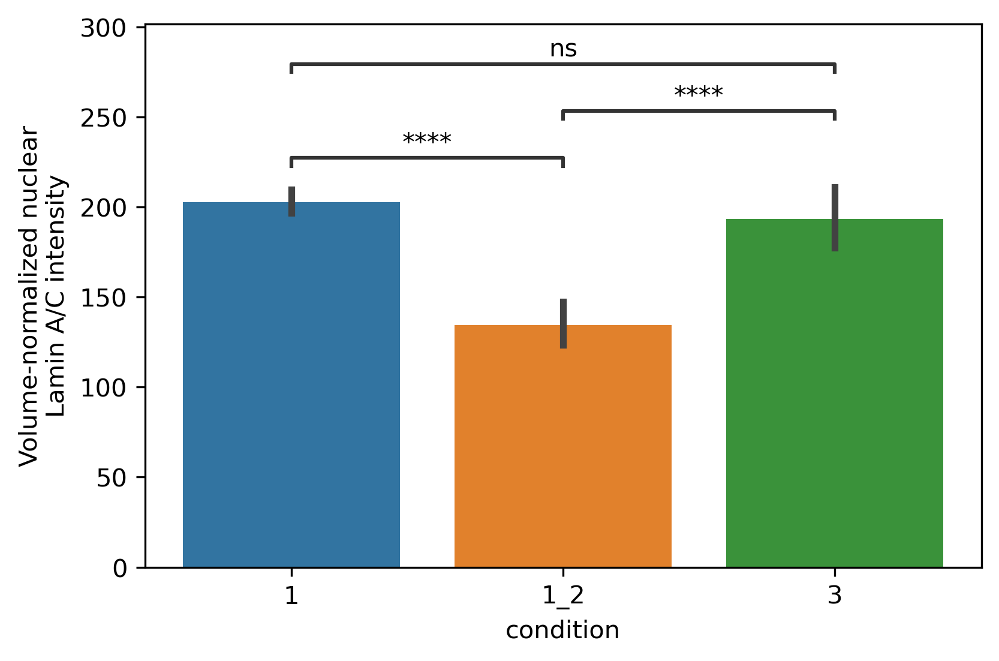

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:2.954e-200 t=3.512e+01
1_2 vs. 3: t-test independent samples, P_val:1.312e-53 t=-1.595e+01
1 vs. 3: t-test independent samples, P_val:5.617e-01 t=5.805e-01


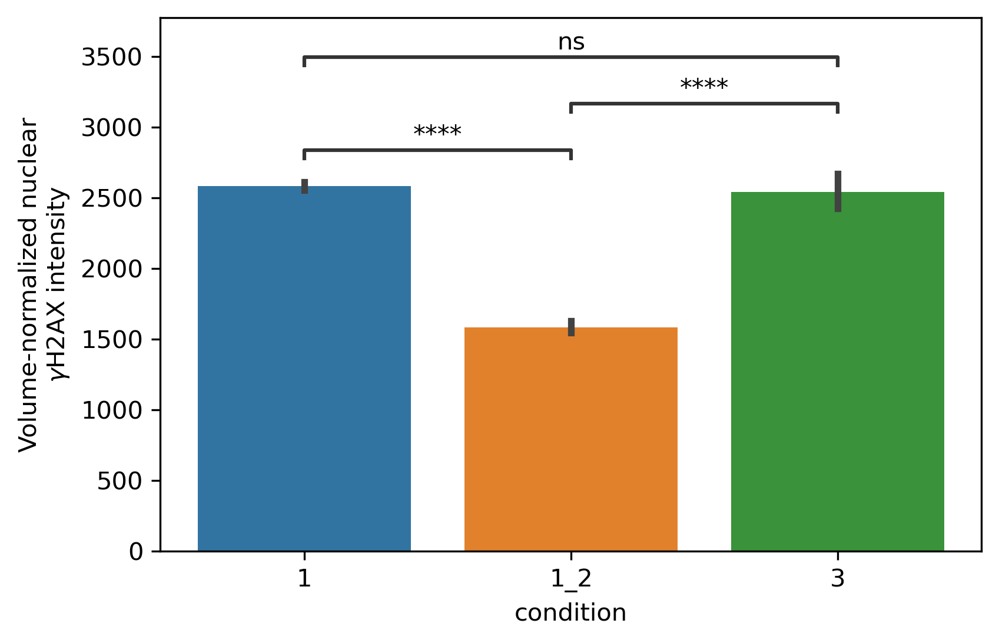

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 1_2: t-test independent samples, P_val:7.677e-02 t=-1.771e+00
1_2 vs. 3: t-test independent samples, P_val:9.889e-01 t=-1.396e-02
1 vs. 3: t-test independent samples, P_val:1.071e-01 t=-1.612e+00


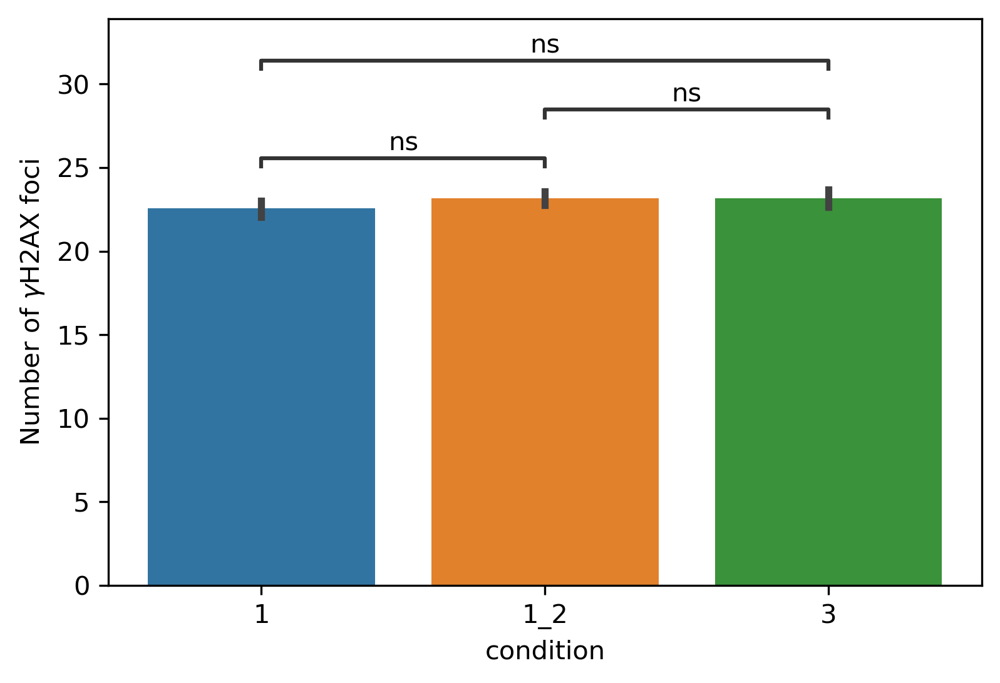

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [133]:
markers = ["rel_lamin_3d_int", "rel_gh2ax_3d_int", "gh2ax_foci_count"]
marker_labels = [
    "Volume-normalized nuclear\nLamin A/C intensity",
    "Volume-normalized nuclear\n" r"$\gamma$H2AX intensity",
    r"Number of $\gamma$H2AX foci",
]
plot_rep_protein_markers_dist(
    sampled_rep1_data.append(sampled_rep1_2_data).append(sampled_rep3_data),
    markers,
    marker_labels,
    quantiles=None,
    cut=0,
    plot_type="bar",
)

---

## 4. Supplemental